<a href="https://colab.research.google.com/github/NathoC31/Challenge-Telecom-X-an-lisis-de-evasi-n-de-clientes/blob/main/TelecomX_LATAM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#📌 Extracción

#Nathaly Cuasapaz

#Extracción de datos

✅ Cargar los datos directamente desde la API utilizando Python.


✅ Convertir los datos a un DataFrame de Pandas para facilitar su manipulación.

In [5]:
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


import numpy as np
import requests
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
import json

url = '/content/TelecomX_Data.json'
# Use json.load to read the local file
with open(url, 'r') as f:
    df = json.load(f)

datos = pd.json_normalize(df, sep='_')
df = pd.DataFrame(datos)

### Importar y manipular datos desde una API

In [7]:
datos.head()

,customerID,Churn,customer_gender,customer_SeniorCitizen,customer_Partner,customer_Dependents,customer_tenure,phone_PhoneService,phone_MultipleLines,internet_InternetService,internet_OnlineSecurity,internet_OnlineBackup,internet_DeviceProtection,internet_TechSupport,internet_StreamingTV,internet_StreamingMovies,account_Contract,account_PaperlessBilling,account_PaymentMethod,account_Charges_Monthly,account_Charges_Total
0,0002-ORFBO,No,Female,0,Yes,Yes,9,Yes,No,DSL,No,Yes,No,Yes,Yes,No,One year,Yes,Mailed check,65.6,593.3
1,0003-MKNFE,No,Male,0,No,No,9,Yes,Yes,DSL,No,No,No,No,No,Yes,Month-to-month,No,Mailed check,59.9,542.4
2,0004-TLHLJ,Yes,Male,0,No,No,4,Yes,No,Fiber optic,No,No,Yes,No,No,No,Month-to-month,Yes,Electronic check,73.9,280.85
3,0011-IGKFF,Yes,Male,1,Yes,No,13,Yes,No,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,98.0,1237.85
4,0013-EXCHZ,Yes,Female,1,Yes,No,3,Yes,No,Fiber optic,No,No,No,Yes,Yes,No,Month-to-month,Yes,Mailed check,83.9,267.4


#🔧 Transformación

### Explorar las columnas del dataset y tipos de datos

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7267 entries, 0 to 7266
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   customerID                 7267 non-null   object 
 1   Churn                      7267 non-null   object 
 2   customer_gender            7267 non-null   object 
 3   customer_SeniorCitizen     7267 non-null   int64  
 4   customer_Partner           7267 non-null   object 
 5   customer_Dependents        7267 non-null   object 
 6   customer_tenure            7267 non-null   int64  
 7   phone_PhoneService         7267 non-null   object 
 8   phone_MultipleLines        7267 non-null   object 
 9   internet_InternetService   7267 non-null   object 
 10  internet_OnlineSecurity    7267 non-null   object 
 11  internet_OnlineBackup      7267 non-null   object 
 12  internet_DeviceProtection  7267 non-null   object 
 13  internet_TechSupport       7267 non-null   objec

In [9]:
datos.columns

Index(['customerID', 'Churn', 'customer_gender', 'customer_SeniorCitizen',
       'customer_Partner', 'customer_Dependents', 'customer_tenure',
       'phone_PhoneService', 'phone_MultipleLines', 'internet_InternetService',
       'internet_OnlineSecurity', 'internet_OnlineBackup',
       'internet_DeviceProtection', 'internet_TechSupport',
       'internet_StreamingTV', 'internet_StreamingMovies', 'account_Contract',
       'account_PaperlessBilling', 'account_PaymentMethod',
       'account_Charges_Monthly', 'account_Charges_Total'],
      dtype='object')

In [10]:
df.describe()

,customer_SeniorCitizen,customer_tenure,account_Charges_Monthly
count,7267.000000,7267.000000,7267.000000
mean,0.162653,32.346498,64.720098
std,0.369074,24.571773,30.129572
min,0.000000,0.000000,18.250000
25%,0.000000,9.000000,35.425000
50%,0.000000,29.000000,70.300000
75%,0.000000,55.000000,89.875000
max,1.000000,72.000000,118.750000


In [11]:
for col in df.columns:
    print(f"{col}: {df[col].nunique()} valores únicos")

customerID: 7267 valores únicos
Churn: 3 valores únicos
customer_gender: 2 valores únicos
customer_SeniorCitizen: 2 valores únicos
customer_Partner: 2 valores únicos
customer_Dependents: 2 valores únicos
customer_tenure: 73 valores únicos
phone_PhoneService: 2 valores únicos
phone_MultipleLines: 3 valores únicos
internet_InternetService: 3 valores únicos
internet_OnlineSecurity: 3 valores únicos
internet_OnlineBackup: 3 valores únicos
internet_DeviceProtection: 3 valores únicos
internet_TechSupport: 3 valores únicos
internet_StreamingTV: 3 valores únicos
internet_StreamingMovies: 3 valores únicos
account_Contract: 3 valores únicos
account_PaperlessBilling: 2 valores únicos
account_PaymentMethod: 4 valores únicos
account_Charges_Monthly: 1585 valores únicos
account_Charges_Total: 6531 valores únicos


###  Identificar columnas clave para el análisis de evasión

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


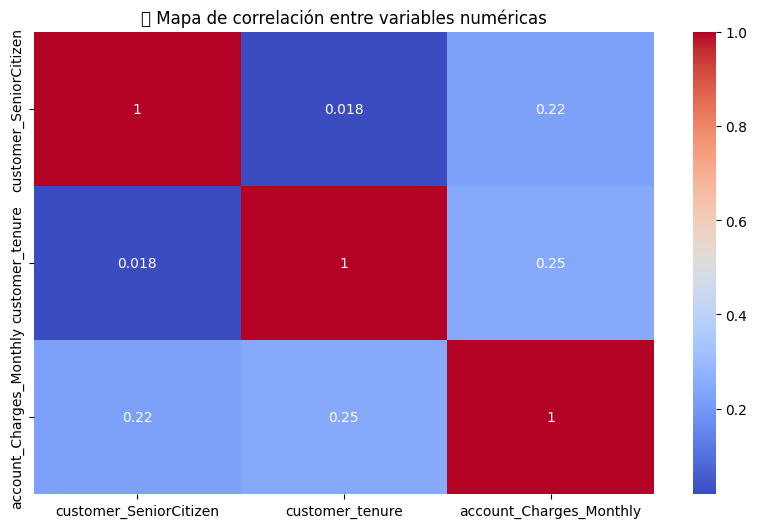

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

# Seleccionamos numéricas para ver correlación
df_num = df.select_dtypes(include='number')

# Mapa de calor de correlación
plt.figure(figsize=(10, 6))
sns.heatmap(df_num.corr(), annot=True, cmap='coolwarm')
plt.title("🔍 Mapa de correlación entre variables numéricas")
plt.show()


### Buscar valores nulos (ausentes)

In [13]:
df.isnull()

,customerID,Churn,customer_gender,customer_SeniorCitizen,customer_Partner,customer_Dependents,customer_tenure,phone_PhoneService,phone_MultipleLines,internet_InternetService,internet_OnlineSecurity,internet_OnlineBackup,internet_DeviceProtection,internet_TechSupport,internet_StreamingTV,internet_StreamingMovies,account_Contract,account_PaperlessBilling,account_PaymentMethod,account_Charges_Monthly,account_Charges_Total
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
6,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
7,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
8,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
9,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [14]:
df.isnull().sum()

,0
customerID,0
Churn,0
customer_gender,0
customer_SeniorCitizen,0
customer_Partner,0
customer_Dependents,0
customer_tenure,0
phone_PhoneService,0
phone_MultipleLines,0
internet_InternetService,0


In [15]:
df = df.fillna(0)
df.isnull().sum()

,0
customerID,0
Churn,0
customer_gender,0
customer_SeniorCitizen,0
customer_Partner,0
customer_Dependents,0
customer_tenure,0
phone_PhoneService,0
phone_MultipleLines,0
internet_InternetService,0


###  Buscar registros duplicados

In [16]:
duplicados = df.duplicated()
print(f" Registros duplicados: {duplicados.sum()}")

df = df.drop_duplicates()


 Registros duplicados: 0


### Errores de formato o tipos de datos incorrectos

In [75]:

print("Tipos de datos:")
print(df.dtypes)


Tipos de datos:
customerid                category
churn                       object
genero                       int64
adulto_mayor                 int64
tiene_pareja                 int64
tiene_dependientes           int64
antiguedad_meses             int64
tiene_telefono            category
tiene_varias_lineas       category
tipo_internet             category
seguridad_en_linea        category
respaldo_en_linea         category
proteccion_dispositivo    category
soporte_tecnico           category
streaming_tv              category
streaming_peliculas       category
tipo_contrato             category
factura_electronica       category
metodo_pago               category
cargo_mensual              float64
cargo_total                float64
cargo_diario               float64
dtype: object


In [18]:
print(df.columns.tolist())


['customerID', 'Churn', 'customer_gender', 'customer_SeniorCitizen', 'customer_Partner', 'customer_Dependents', 'customer_tenure', 'phone_PhoneService', 'phone_MultipleLines', 'internet_InternetService', 'internet_OnlineSecurity', 'internet_OnlineBackup', 'internet_DeviceProtection', 'internet_TechSupport', 'internet_StreamingTV', 'internet_StreamingMovies', 'account_Contract', 'account_PaperlessBilling', 'account_PaymentMethod', 'account_Charges_Monthly', 'account_Charges_Total']


In [19]:

df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
print(df.columns.tolist())


['customerid', 'churn', 'customer_gender', 'customer_seniorcitizen', 'customer_partner', 'customer_dependents', 'customer_tenure', 'phone_phoneservice', 'phone_multiplelines', 'internet_internetservice', 'internet_onlinesecurity', 'internet_onlinebackup', 'internet_deviceprotection', 'internet_techsupport', 'internet_streamingtv', 'internet_streamingmovies', 'account_contract', 'account_paperlessbilling', 'account_paymentmethod', 'account_charges_monthly', 'account_charges_total']


In [20]:

df['account_charges_total'] = pd.to_numeric(df['account_charges_total'], errors='coerce')


### Inconsistencias en columnas categóricas

In [21]:

columnas_categoricas = df.select_dtypes(include='object').columns

print("\n Revisión de categorías:")
for col in columnas_categoricas:
    print(f"{col}: {df[col].unique()}")



 Revisión de categorías:
customerid: ['0002-ORFBO' '0003-MKNFE' '0004-TLHLJ' ... '9992-UJOEL' '9993-LHIEB'
 '9995-HOTOH']
churn: ['No' 'Yes' '']
customer_gender: ['Female' 'Male']
customer_partner: ['Yes' 'No']
customer_dependents: ['Yes' 'No']
phone_phoneservice: ['Yes' 'No']
phone_multiplelines: ['No' 'Yes' 'No phone service']
internet_internetservice: ['DSL' 'Fiber optic' 'No']
internet_onlinesecurity: ['No' 'Yes' 'No internet service']
internet_onlinebackup: ['Yes' 'No' 'No internet service']
internet_deviceprotection: ['No' 'Yes' 'No internet service']
internet_techsupport: ['Yes' 'No' 'No internet service']
internet_streamingtv: ['Yes' 'No' 'No internet service']
internet_streamingmovies: ['No' 'Yes' 'No internet service']
account_contract: ['One year' 'Month-to-month' 'Two year']
account_paperlessbilling: ['Yes' 'No']
account_paymentmethod: ['Mailed check' 'Electronic check' 'Credit card (automatic)'
 'Bank transfer (automatic)']


In [22]:
df = df[df['churn'] != '']

In [23]:
print(df['churn'].value_counts(dropna=False))


churn
No     5174
Yes    1869
Name: count, dtype: int64


In [24]:

df['churn'] = df['churn'].replace('', pd.NA)

df = df.dropna(subset=['churn'])


In [25]:
print(df.columns.tolist())


['customerid', 'churn', 'customer_gender', 'customer_seniorcitizen', 'customer_partner', 'customer_dependents', 'customer_tenure', 'phone_phoneservice', 'phone_multiplelines', 'internet_internetservice', 'internet_onlinesecurity', 'internet_onlinebackup', 'internet_deviceprotection', 'internet_techsupport', 'internet_streamingtv', 'internet_streamingmovies', 'account_contract', 'account_paperlessbilling', 'account_paymentmethod', 'account_charges_monthly', 'account_charges_total']


In [26]:
columnas_internet = [
    'internet_onlinesecurity', 'internet_onlinebackup',
    'internet_deviceprotection', 'internet_techsupport',
    'internet_streamingtv', 'internet_streamingmovies'
]

for col in columnas_internet:
    df[col] = df[col].replace('No internet service', 'No')


In [27]:
df['phone_multiplelines'] = df['phone_multiplelines'].replace('No phone service', 'No')


In [28]:
df['account_paymentmethod'] = df['account_paymentmethod'].str.lower().str.replace(' ', '_').str.replace('(', '').str.replace(')', '')


In [29]:
df['account_contract'] = df['account_contract'].str.lower().str.replace(' ', '_')


In [30]:
df['customer_gender'] = df['customer_gender'].astype(str).replace({'Male': 1, 'Female': 0}).astype(int)


/tmp/ipython-input-1596194956.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['customer_gender'] = df['customer_gender'].astype(str).replace({'Male': 1, 'Female': 0}).astype(int)


In [31]:
cat_cols = df.select_dtypes(include='object').columns

for col in cat_cols:
    df[col] = df[col].astype('category')


### Confirmación final del estado del dataset

In [32]:
print("\n✅ Estado final de limpieza:")
print(df.info())



✅ Estado final de limpieza:
<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 0 to 7266
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   customerid                 7043 non-null   category
 1   churn                      7043 non-null   category
 2   customer_gender            7043 non-null   int64   
 3   customer_seniorcitizen     7043 non-null   int64   
 4   customer_partner           7043 non-null   category
 5   customer_dependents        7043 non-null   category
 6   customer_tenure            7043 non-null   int64   
 7   phone_phoneservice         7043 non-null   category
 8   phone_multiplelines        7043 non-null   category
 9   internet_internetservice   7043 non-null   category
 10  internet_onlinesecurity    7043 non-null   category
 11  internet_onlinebackup      7043 non-null   category
 12  internet_deviceprotection  7043 non-null   category
 13  internet_

In [33]:
df = df.dropna(subset=['account_charges_total'])


In [34]:
print(df['churn'].value_counts())



churn
No     5163
Yes    1869
Name: count, dtype: int64


In [35]:
for col in df.select_dtypes(include='category').columns:
    print(f"\n{col}:")
    print(df[col].value_counts())



customerid:
customerid
9995-HOTOH    1
0002-ORFBO    1
0003-MKNFE    1
9970-QBCDA    1
9968-FFVVH    1
9967-ATRFS    1
9965-YOKZB    1
9964-WBQDJ    1
9962-BFPDU    1
9961-JBNMK    1
9959-WOFKT    1
9958-MEKUC    1
9957-YODKZ    1
9955-QOPOY    1
9953-ZMKSM    1
9950-MTGYX    1
9948-YPTDG    1
9947-OTFQU    1
9945-PSVIP    1
0056-EPFBG    1
0052-YNYOT    1
0052-DCKON    1
0048-PIHNL    1
0048-LUMLS    1
0042-RLHYP    1
0042-JVWOJ    1
0040-HALCW    1
0036-IHMOT    1
0032-PGELS    1
0031-PVLZI    1
0030-FNXPP    1
0027-KWYKW    1
0023-XUOPT    1
0023-UYUPN    1
0023-HGHWL    1
0083-PIVIK    1
0082-OQIQY    1
0082-LDZUE    1
0080-OROZO    1
0080-EMYVY    1
0078-XZMHT    1
0076-LVEPS    1
0074-HDKDG    1
0071-NDAFP    1
0068-FIGTF    1
0067-DKWBL    1
0064-YIJGF    1
0064-SUDOG    1
0060-FUALY    1
0058-EVZWM    1
0057-QBUQH    1
0112-QAWRZ    1
0111-KLBQG    1
0107-YHINA    1
0107-WESLM    1
0106-UGRDO    1
0106-GHRQR    1
0104-PPXDV    1
0103-CSITQ    1
0100-DUVFC    1
0098-BOWSO    1


In [36]:
df.reset_index(drop=True, inplace=True)


### Paso para crear la columna cuentas_diarias

In [37]:
df.loc[:, 'cuentas_diarias'] = df['account_charges_monthly'] / 30


In [38]:
df = df[df['churn'] != ''].copy()


In [39]:
df['cuentas_diarias'] = df['account_charges_monthly'] / 30

print(df[['account_charges_monthly', 'cuentas_diarias']].head())



   account_charges_monthly  cuentas_diarias
0                     65.6         2.186667
1                     59.9         1.996667
2                     73.9         2.463333
3                     98.0         3.266667
4                     83.9         2.796667


In [40]:
df['cuentas_diarias'] = df['cuentas_diarias'].round(2)

In [41]:
print(df.columns.tolist())


['customerid', 'churn', 'customer_gender', 'customer_seniorcitizen', 'customer_partner', 'customer_dependents', 'customer_tenure', 'phone_phoneservice', 'phone_multiplelines', 'internet_internetservice', 'internet_onlinesecurity', 'internet_onlinebackup', 'internet_deviceprotection', 'internet_techsupport', 'internet_streamingtv', 'internet_streamingmovies', 'account_contract', 'account_paperlessbilling', 'account_paymentmethod', 'account_charges_monthly', 'account_charges_total', 'cuentas_diarias']


### Transformar valores categóricos “Sí” / “No” en binarios (1 / 0)

In [42]:
cols_binarias = [
    'churn', 'customer_partner', 'customer_dependents',
    'phone_phoneservice', 'phone_multiplelines',
    'internet_onlinesecurity', 'internet_onlinebackup',
    'internet_deviceprotection', 'internet_techsupport',
    'internet_streamingtv', 'internet_streamingmovies',
    'account_paperlessbilling'
]


In [43]:
cols_binarias = [
    'churn', 'tiene_pareja', 'tiene_dependientes',
    ...
]


In [44]:
for col in cols_binarias:
    if col in df.columns:
        df[col] = df[col].astype(str).replace({'Yes': 1, 'No': 0}).astype(int)
    else:
        print(f"⚠️ Columna no encontrada: {col}")


⚠️ Columna no encontrada: tiene_pareja
⚠️ Columna no encontrada: tiene_dependientes
⚠️ Columna no encontrada: Ellipsis


/tmp/ipython-input-1833761345.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].astype(str).replace({'Yes': 1, 'No': 0}).astype(int)


In [61]:
for col in cols_binarias:
    if col in df.columns:
        df[col] = df[col].astype('object')
        df[col] = df[col].replace({'Yes': 1, 'No': 0}).astype(int)
    else:
        print(f"Columna no encontrada: {col}")


Columna no encontrada: Ellipsis


/tmp/ipython-input-430427479.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].replace({'Yes': 1, 'No': 0}).astype(int)
/tmp/ipython-input-430427479.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].replace({'Yes': 1, 'No': 0}).astype(int)


In [46]:
df.rename(columns={
    'customer_gender': 'genero',
    'customer_seniorcitizen': 'adulto_mayor',
    'customer_partner': 'tiene_pareja',
    'customer_dependents': 'tiene_dependientes',
    'customer_tenure': 'antiguedad_meses',
    'phone_phoneservice': 'tiene_telefono',
    'phone_multiplelines': 'tiene_varias_lineas',
    'internet_internetservice': 'tipo_internet',
    'internet_onlinesecurity': 'seguridad_en_linea',
    'internet_onlinebackup': 'respaldo_en_linea',
    'internet_deviceprotection': 'proteccion_dispositivo',
    'internet_techsupport': 'soporte_tecnico',
    'internet_streamingtv': 'streaming_tv',
    'internet_streamingmovies': 'streaming_peliculas',
    'account_contract': 'tipo_contrato',
    'account_paperlessbilling': 'factura_electronica',
    'account_paymentmethod': 'metodo_pago',
    'account_charges_monthly': 'cargo_mensual',
    'account_charges_total': 'cargo_total',
    'cuentas_diarias': 'cargo_diario'
}, inplace=True)


In [47]:
df['genero'] = df['genero'].astype(str).replace({'Male': 1, 'Female': 0}).astype(int)




In [48]:
print(df.head())
print(df.dtypes)


   customerid  churn  genero  adulto_mayor tiene_pareja tiene_dependientes  \
0  0002-ORFBO      0       0             0          Yes                Yes   
1  0003-MKNFE      0       1             0           No                 No   
2  0004-TLHLJ      1       1             0           No                 No   
3  0011-IGKFF      1       1             1          Yes                 No   
4  0013-EXCHZ      1       0             1          Yes                 No   

   antiguedad_meses tiene_telefono tiene_varias_lineas tipo_internet  \
0                 9            Yes                  No           DSL   
1                 9            Yes                 Yes           DSL   
2                 4            Yes                  No   Fiber optic   
3                13            Yes                  No   Fiber optic   
4                 3            Yes                  No   Fiber optic   

  seguridad_en_linea respaldo_en_linea proteccion_dispositivo soporte_tecnico  \
0                

#Carga y análisis

## Análisis Descriptivo


### Análisis general de columnas numéricas

In [62]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
churn,7032.0,0.265785,0.441782,0.00,0.0000,0.000,1.0000,1.00
genero,7032.0,0.504693,0.500014,0.00,0.0000,1.000,1.0000,1.00
adulto_mayor,7032.0,0.162400,0.368844,0.00,0.0000,0.000,0.0000,1.00
tiene_pareja,7032.0,0.482509,0.499729,0.00,0.0000,0.000,1.0000,1.00
tiene_dependientes,7032.0,0.298493,0.457629,0.00,0.0000,0.000,1.0000,1.00
antiguedad_meses,7032.0,32.421786,24.545260,1.00,9.0000,29.000,55.0000,72.00
cargo_mensual,7032.0,64.798208,30.085974,18.25,35.5875,70.350,89.8625,118.75
cargo_total,7032.0,2283.300441,2266.771362,18.80,401.4500,1397.475,3794.7375,8684.80
cargo_diario,7032.0,2.159891,1.002955,0.61,1.1875,2.340,2.9925,3.96


### Análisis personalizado (media, mediana, desviación, etc.)

In [63]:
import numpy as np

columnas_numericas = [
    'antiguedad_meses',
    'cargo_mensual',
    'cargo_total',
    'cargo_diario'
]

for col in columnas_numericas:
    print(f"\n📊 Estadísticas para: {col}")
    print(f"Media: {df[col].mean():.2f}")
    print(f"Mediana: {df[col].median():.2f}")
    print(f"Desviación estándar: {df[col].std():.2f}")
    print(f"Mínimo: {df[col].min():.2f}")
    print(f"Máximo: {df[col].max():.2f}")
    print(f"Coeficiente de variación: {(df[col].std() / df[col].mean()):.2%}")


📊 Estadísticas para: antiguedad_meses
Media: 32.42
Mediana: 29.00
Desviación estándar: 24.55
Mínimo: 1.00
Máximo: 72.00
Coeficiente de variación: 75.71%

📊 Estadísticas para: cargo_mensual
Media: 64.80
Mediana: 70.35
Desviación estándar: 30.09
Mínimo: 18.25
Máximo: 118.75
Coeficiente de variación: 46.43%

📊 Estadísticas para: cargo_total
Media: 2283.30
Mediana: 1397.47
Desviación estándar: 2266.77
Mínimo: 18.80
Máximo: 8684.80
Coeficiente de variación: 99.28%

📊 Estadísticas para: cargo_diario
Media: 2.16
Mediana: 2.34
Desviación estándar: 1.00
Mínimo: 0.61
Máximo: 3.96
Coeficiente de variación: 46.44%


### Distribución de churn

In [64]:
print("📉 Distribución de churn:")
print(df['churn'].value_counts())
print("\n% de churn:")
print(df['churn'].value_counts(normalize=True) * 100)


📉 Distribución de churn:
churn
0    5163
1    1869
Name: count, dtype: int64

% de churn:
churn
0    73.421502
1    26.578498
Name: proportion, dtype: float64


### Agrupaciones útiles

In [65]:
df.groupby('churn')[['cargo_total', 'cargo_diario']].mean()


,cargo_total,cargo_diario
churn,,
0,2555.344141,2.043486
1,1531.796094,2.481450


## Distribución de evasión

### Gráfico de barras muestra el conteo total de clientes que se quedaron (No) y los que se fueron (Yes).

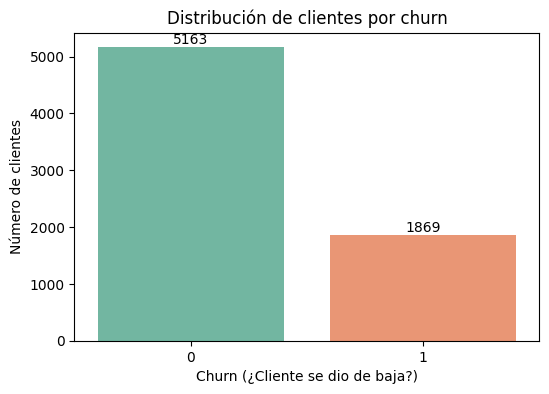

In [66]:
import matplotlib.pyplot as plt
import seaborn as sns

df['churn'] = df['churn'].astype(str)

#  1. Gráfico de barras
plt.figure(figsize=(6, 4))
ax = sns.countplot(data=df, x='churn', hue='churn', dodge=False, palette='Set2', legend=False)
plt.title('Distribución de clientes por churn')
plt.xlabel('Churn (¿Cliente se dio de baja?)')
plt.ylabel('Número de clientes')

for container in ax.containers:
    ax.bar_label(container)

plt.show()




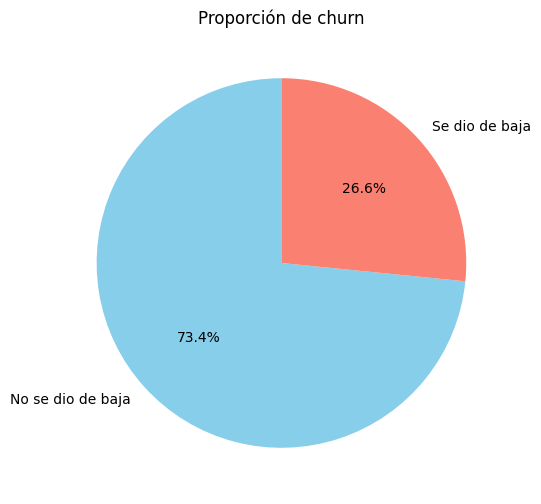

In [67]:
# 2. Gráfico de pastel

plt.figure(figsize=(6,6))
df['churn'].value_counts().plot.pie(
    autopct='%1.1f%%',
    startangle=90,
    colors=['skyblue','salmon'],
    labels=['No se dio de baja', 'Se dio de baja']
)
plt.title('Proporción de churn')
plt.ylabel('')
plt.show()

## Recuento de evasión por variables categóricas

### Evasión según género

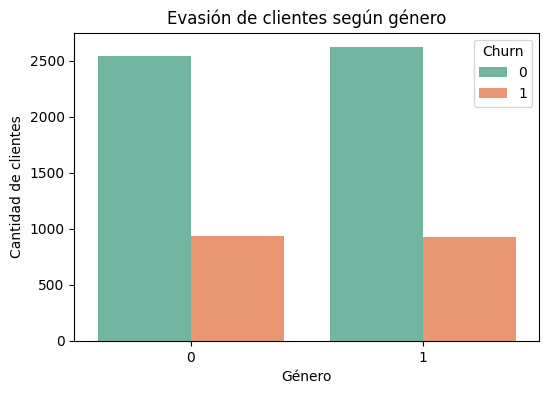

In [68]:
import seaborn as sns
import matplotlib.pyplot as plt

# Evasión por género
plt.figure(figsize=(6, 4))
sns.countplot(data=df, x='genero', hue='churn', palette='Set2')
plt.title('Evasión de clientes según género')
plt.xlabel('Género')
plt.ylabel('Cantidad de clientes')
plt.legend(title='Churn')
plt.show()

###  Evasión según tipo de contrato

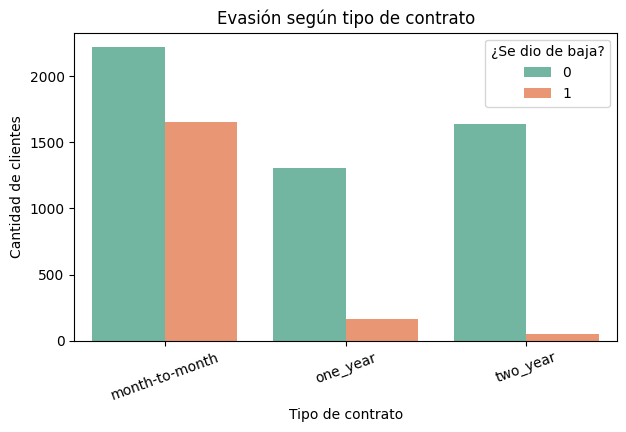

In [69]:
plt.figure(figsize=(7, 4))
sns.countplot(data=df, x='tipo_contrato', hue='churn', palette='Set2')
plt.title('Evasión según tipo de contrato')
plt.xlabel('Tipo de contrato')
plt.ylabel('Cantidad de clientes')
plt.legend(title='¿Se dio de baja?')
plt.xticks(rotation=20)
plt.show()



### Evasión según método de pago

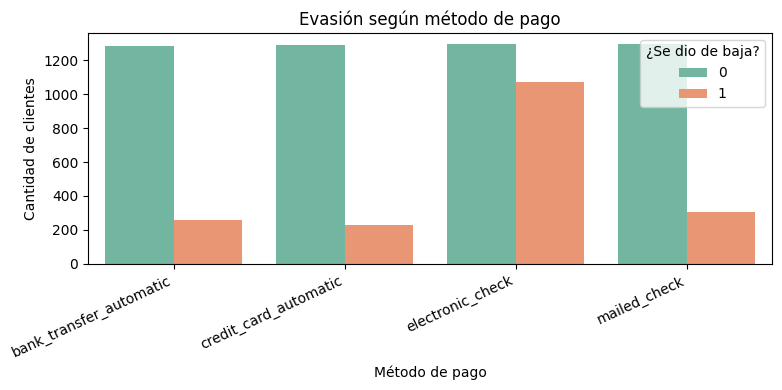

In [70]:
plt.figure(figsize=(8, 4))
sns.countplot(data=df, x='metodo_pago', hue='churn', palette='Set2')
plt.title('Evasión según método de pago')
plt.xlabel('Método de pago')
plt.ylabel('Cantidad de clientes')
plt.legend(title='¿Se dio de baja?')
plt.xticks(rotation=25, ha='right')
plt.tight_layout()
plt.show()


### Gráfico repetido para otras variables relevantes

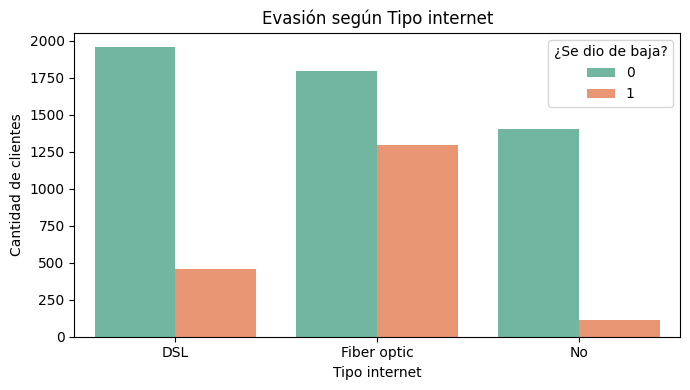

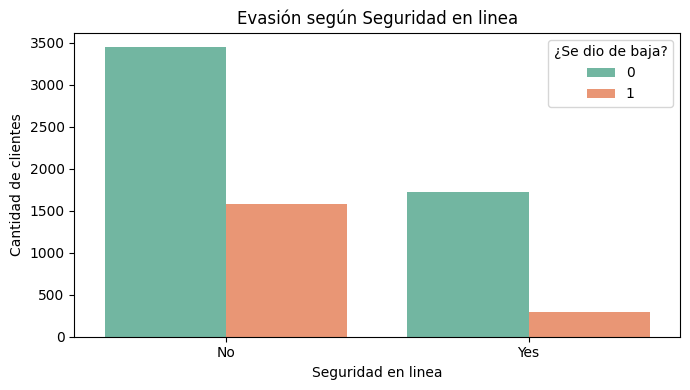

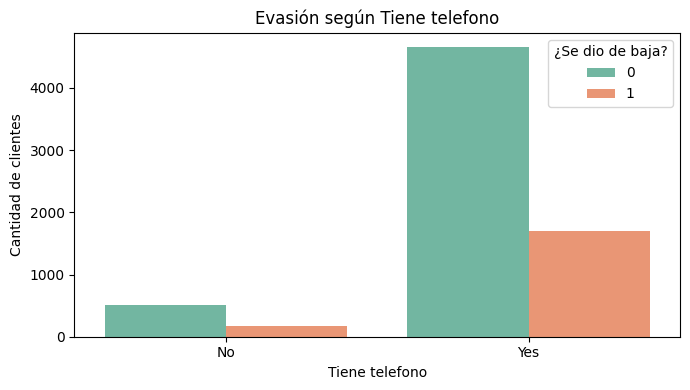

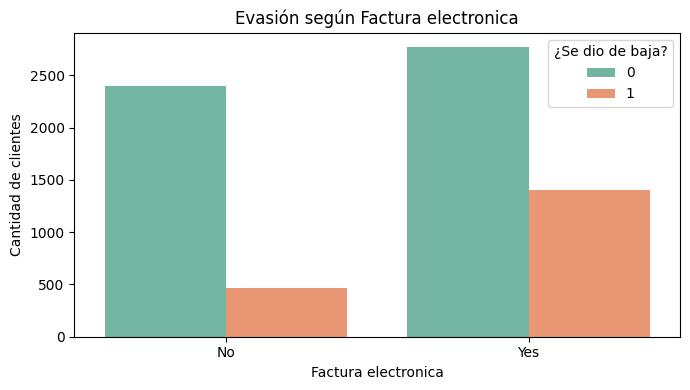

In [71]:
variables = [
    'tipo_internet',
    'seguridad_en_linea',
    'tiene_telefono',
    'factura_electronica'
]

for var in variables:
    plt.figure(figsize=(7, 4))
    sns.countplot(data=df, x=var, hue='churn', palette='Set2')
    plt.title(f'Evasión según {var.replace("_", " ").capitalize()}')
    plt.xlabel(var.replace("_", " ").capitalize())
    plt.ylabel('Cantidad de clientes')
    plt.legend(title='¿Se dio de baja?')
    plt.tight_layout()
    plt.show()


## Conteo de evasión por variables numéricas

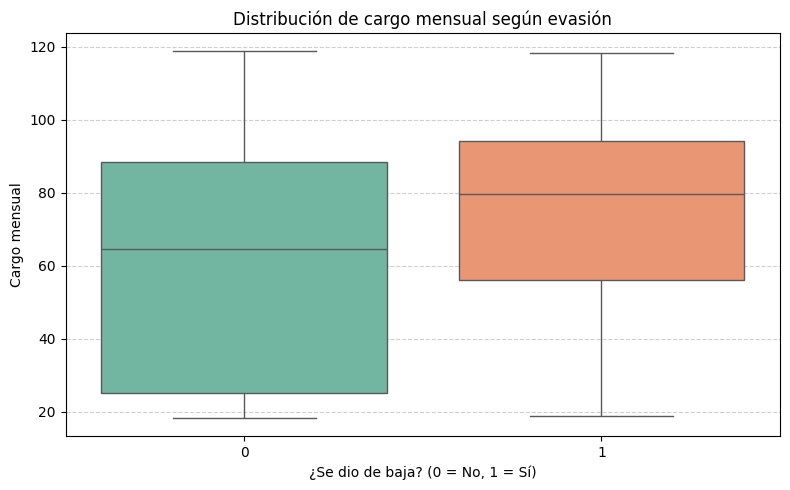

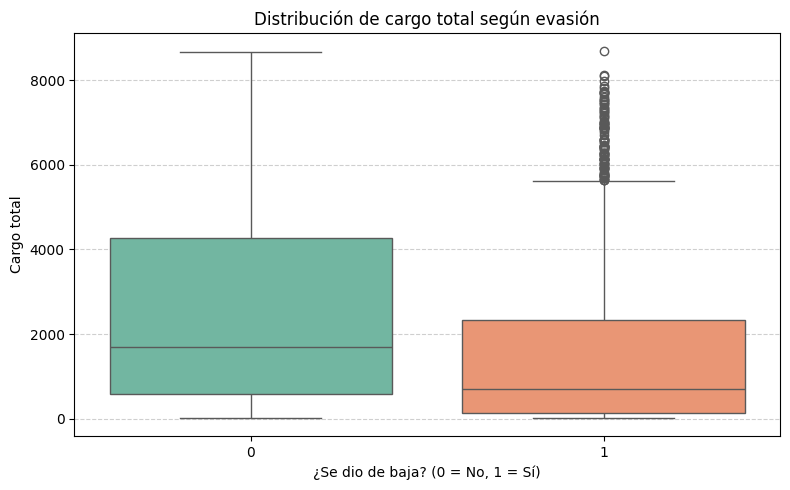

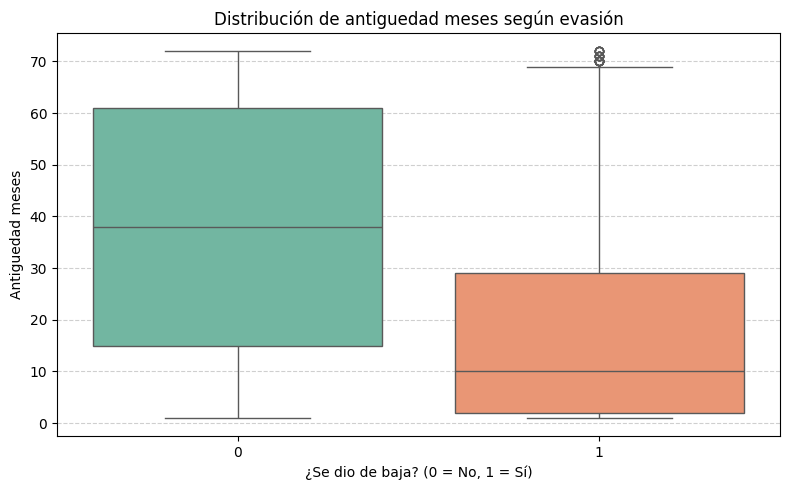

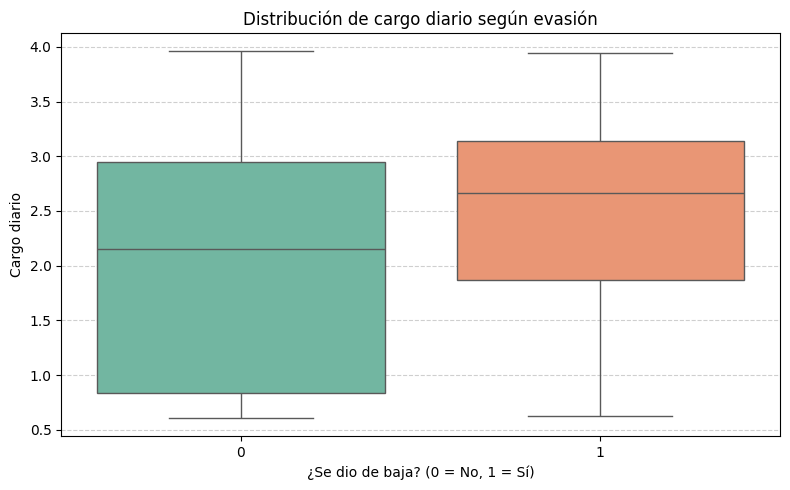

In [72]:
import seaborn as sns
import matplotlib.pyplot as plt

df['churn'] = df['churn'].astype(str)

variables_numericas = ['cargo_mensual', 'cargo_total', 'antiguedad_meses', 'cargo_diario']

for var in variables_numericas:
    plt.figure(figsize=(8, 5))
    sns.boxplot(data=df, x='churn', y=var, hue='churn', palette='Set2', legend=False, dodge=False)
    plt.title(f'Distribución de {var.replace("_", " ")} según evasión')
    plt.xlabel('¿Se dio de baja? (0 = No, 1 = Sí)')
    plt.ylabel(var.replace("_", " ").capitalize())
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()



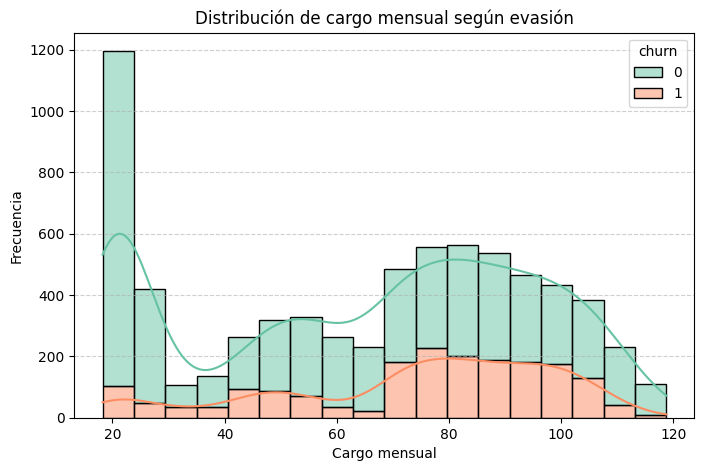

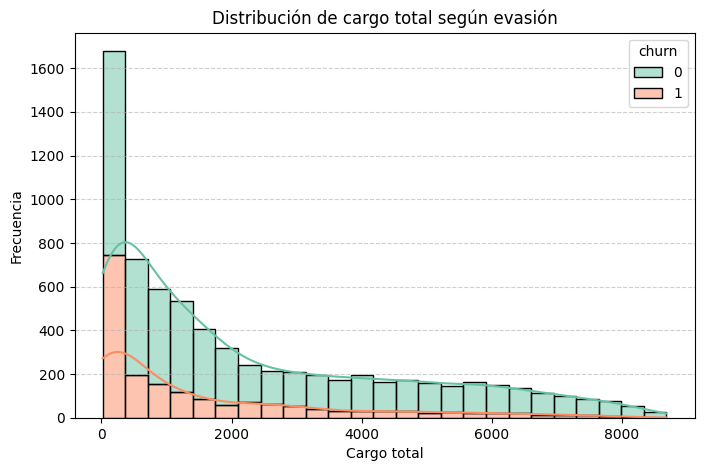

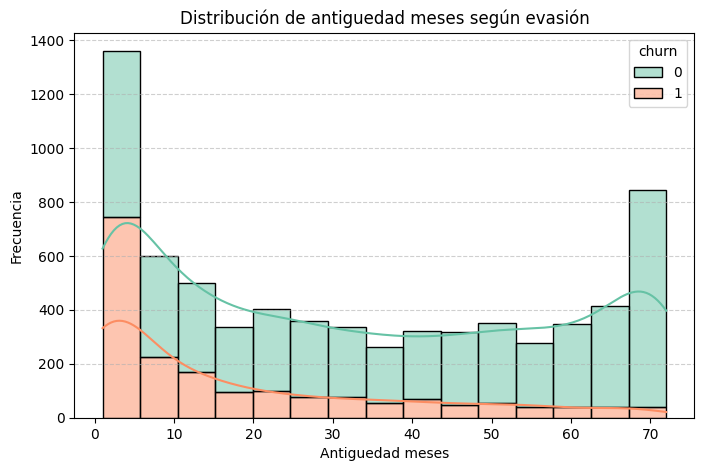

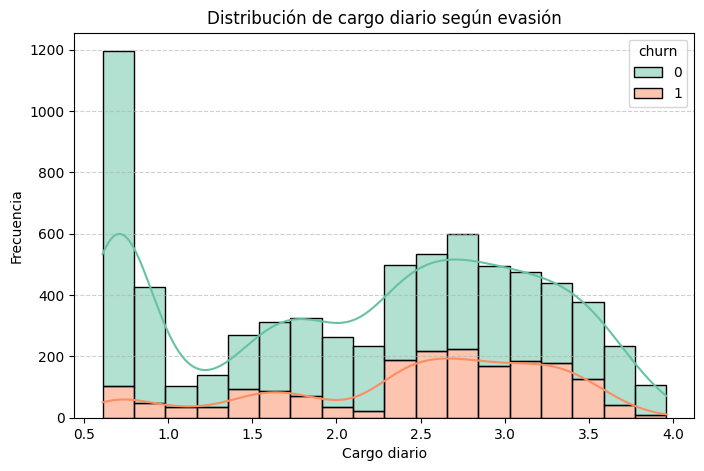

In [73]:
for var in variables_numericas:
    plt.figure(figsize=(8, 5))
    sns.histplot(data=df, x=var, hue='churn', kde=True, multiple='stack', palette='Set2')
    plt.title(f'Distribución de {var.replace("_", " ")} según evasión')
    plt.xlabel(var.replace("_", " ").capitalize())
    plt.ylabel('Frecuencia')
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.show()


#📄Informe final

## Introducción

El presente análisis tiene como objetivo principal identificar patrones que expliquen la evasión de clientes (Churn) en la empresa Telecom X, dedicada a servicios de telefonía e internet. Comprender los factores que influyen en la pérdida de clientes es crucial para implementar estrategias que aumenten la retención y mejoren la satisfacción del usuario.

## Limpieza y Tratamiento de Datos

Se realizó un proceso exhaustivo de preprocesamiento, que incluyó los siguientes pasos:

1. Carga de datos en formato JSON y expansión de columnas anidadas en secciones: customer, phone, internet y account.

2. Revisión de columnas, tipos de datos y valores únicos categóricos.

3. Corrección de valores vacíos y errores:

*   Se eliminaron filas con Churn vacío.
*   Se reemplazaron valores como ' ' o 'No internet service' por valores consistentes.
*   Se corrigieron tipos de datos mal definidos como 'Charges.Total', convirtiéndose a float.

4. Traducción y estandarización:
*   Se cambiaron nombres de columnas y valores de inglés a español para facilitar la interpretación.
*   Se crearon variables binarias (Sí/No → 1/0).

5. Nueva variable: Se creó la columna cargo_diario calculada como cargo_mensual / 30.

## Análisis Exploratorio de Datos (EDA)
📊 Análisis Descriptivo

Media y desviación estándar de variables como cargo_mensual, cargo_total y antigüedad_meses se calcularon para comprender la distribución de los datos.

Se observaron clientes con valores nulos en cargo_total, típicamente nuevos usuarios.

📉 Distribución del Churn

Se utilizó un gráfico de barras para mostrar que aproximadamente 27% de los clientes han abandonado el servicio.

Se realizaron comparaciones entre categorías (género, tipo de contrato, método de pago) y la evasión:

Clientes con contrato mes a mes tienen mayor tasa de churn.

El uso de facturación electrónica también se asocia a una tasa mayor.

📦 Variables Numéricas vs. Churn

Se generaron boxplots para comparar cargo_mensual, cargo_total y antigüedad_meses entre clientes que se quedaron y los que se fueron:

Menor antigüedad y cargos mensuales más altos están asociados a mayor evasión.

## Conclusiones e Insights

Clientes con contrato mensual son significativamente más propensos a cancelar.

Clientes con mayor cargo mensual y menor antigüedad muestran mayor evasión.

El uso de servicios como respaldo en línea, seguridad o soporte técnico reduce la tasa de churn.

Los métodos de pago electrónicos no automáticos (como cheque electrónico) están más asociados a cancelaciones.